In [1]:
import os
import json
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# json -> csv for EDA
: EDA를 위해서 json파일을 csv파일로 바꿈
- video_id 
- (device) : cctv만 추출해서 drop
- is_scripted : 0(실증), 1(연출)
- weather : F(맑음), T(우천)
- time : D(주간), N(야간)
- PM_code : 13~19
    - 13 : '정상', 
    - 14 : '보행자도로 통행', 
    - 15 : '안전모 미착용',
    - 16 : '무단횡단',
    - 17 : '신호 위반',
    - 18 : '정지선 위반',
    - 19 : '횡단보도 주행'
    
-> 총 36856 * 5 데이터

In [2]:
os.getcwd()

'C:\\Users\\user\\section6\\tp2\\code_file'

In [3]:
os.chdir('../')

In [4]:
os.getcwd()

'C:\\Users\\user\\section6\\tp2'

In [5]:
os.chdir('data/precleaning_data/labels')

In [6]:
path = os.getcwd()

In [7]:
filename_list = os.listdir()

In [11]:
filename_list[:5]

['C000002_003_0009_C_D_F_0.json',
 'C000002_012_0019_C_D_F_0.json',
 'C000002_014_0304_C_D_F_0.json',
 'C000002_017_0168_C_D_F_0.json',
 'C000002_018_0135_C_D_F_0.json']

In [12]:
df = pd.DataFrame(index=range(0,0), 
                  columns = {'video_id',
                             'device',
                             'time',
                             'weather',
                             'is_scripted',
                             'PM_code'})

In [24]:
# # test 
# with open(path + '/' + filename_list[3], encoding='utf-8') as f:
#     data = json.load(f)
#     video_id = (data['info']['video_id'] + '_' 
#             + data['info']['clip_id'] + '_' 
#             + data['description']['frame_id'] + '_' 
#             + data['info']['device'] + '_' 
#             + data['info']['time']  + '_' 
#             + data['info']['weather'] + '_' 
#             + data['info']['is_scripted']) 
#     print(video_id == filename_list[3].split('.')[0])

True


In [25]:
for filename in tqdm(filename_list):
    with open(path + '/' + filename, encoding = 'utf-8') as f:
        data = json.load(f)

        for i in range(len(data['annotations']['PM'])):    
            pm_code = int(data['annotations']['PM'][i]['PM_code'])
            if pm_code >= 13 and pm_code <=19:
                video_id = (data['info']['video_id'] + '_' 
                            + data['info']['clip_id'] + '_' 
                            + data['description']['frame_id'] + '_' 
                            + data['info']['device'] + '_' 
                            + data['info']['time']  + '_' 
                            + data['info']['weather'] + '_' 
                            + data['info']['is_scripted']) 
                device = data['info']['device']
                time = data['info']['time']
                weather = data['info']['weather']
                is_scripted = data['info']['is_scripted']

                new_list = {'video_id': video_id,
                            'device': device,
                            'time': time,
                            'weather': weather,
                            'is_scripted': is_scripted,
                            'PM_code': pm_code                        
                           }

                df = df.append(new_list, ignore_index=True)

  0%|                                                                                        | 0/56423 [00:00<?, ?it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  0%|                                                                               | 22/56423 [00:00<09:44, 96.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  0%|                                                                               | 53/56423 [00:00<09:49, 95.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  0%|▏                                                                             | 111/56423 [00:01<10:52, 86.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  0%|▏                                                                            | 159/56423 [00:01<08:52, 105.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  0%|▎                                                                             | 191/56423 [00:02<09:36, 97.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  0%|▎                                                                             | 212/56423 [00:02<09:41, 96.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  0%|▎                                                                             | 222/56423 [00:02<10:48, 86.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  0%|▎                                                                             | 240/56423 [00:02<10:54, 85.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

  1%|▍                                                                             | 285/56423 [00:03<11:53, 78.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  1%|▌                                                                             | 372/56423 [00:04<11:45, 79.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  1%|▌                                                                             | 393/56423 [00:04<10:36, 88.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  1%|▌                                                                             | 424/56423 [00:04<09:53, 94.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  1%|▋                                                                             | 456/56423 [00:05<09:24, 99.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  1%|▋                                                                            | 490/56423 [00:05<09:08, 102.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  1%|▋                                                                            | 513/56423 [00:05<08:59, 103.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

  1%|▊                                                                            | 609/56423 [00:06<08:48, 105.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  1%|▊                                                                             | 631/56423 [00:06<09:28, 98.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  1%|▉                                                                            | 703/56423 [00:07<08:14, 112.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  1%|▉                                                                            | 729/56423 [00:07<08:22, 110.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  1%|█              

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  1%|█                                                                            | 803/56423 [00:08<08:31, 108.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  2%|█▏                                                                           | 847/56423 [00:08<08:54, 103.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  2%|█▏                                                                            | 896/56423 [00:09<11:04, 83.52it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  2%|█▎                                                                            | 914/56423 [00:09<11:45, 78.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  2%|█▎                                                                            | 944/56423 [00:09<10:42, 86.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  2%|█▎             

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  2%|█▍                                                                          | 1066/56423 [00:10<07:10, 128.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

  2%|█▋                                                                           | 1225/56423 [00:12<10:39, 86.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  2%|█▋                                                                           | 1257/56423 [00:12<09:27, 97.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  2%|█▊             

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

  2%|█▊                                                                           | 1336/56423 [00:13<10:48, 85.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  2%|█▊                                                                           | 1355/56423 [00:13<10:26, 87.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  3%|██                                                                           | 1474/56423 [00:15<10:12, 89.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  3%|██             

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  3%|██             

  3%|██▏                                                                         | 1583/56423 [00:16<08:17, 110.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

  3%|██▏                                                                          | 1648/56423 [00:17<10:43, 85.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

  3%|██▎                                                                          | 1698/56423 [00:17<09:55, 91.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  3%|██▎            

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

  3%|██▍                                                                         | 1787/56423 [00:18<08:49, 103.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  3%|██▍            

  3%|██▍                                                                         | 1844/56423 [00:19<08:52, 102.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  3%|██▌                                                                          | 1899/56423 [00:19<09:05, 99.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  3%|██▌                                                                         | 1932/56423 [00:20<08:50, 102.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  3%|██▋                                                                         | 1954/56423 [00:20<09:03, 100.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  4%|██▋                                                                          | 1975/56423 [00:20<09:19, 97.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  4%|██▋            

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  4%|██▊            

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  4%|██▊                                                                          | 2105/56423 [00:21<09:13, 98.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  4%|██▉                                                                         | 2143/56423 [00:22<08:03, 112.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  4%|███            

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  4%|███            

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

  4%|███▏                                                                        | 2399/56423 [00:24<08:49, 102.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  4%|███▎                                                                         | 2410/56423 [00:24<10:09, 88.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  4%|███▎                                                                         | 2430/56423 [00:25<10:15, 87.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  4%|███▎                                                                         | 2461/56423 [00:25<09:39, 93.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  4%|███▍                                                                         | 2481/56423 [00:25<10:06, 88.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  4%|███▍                                                                         | 2502/56423 [00:25<09:52, 91.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  4%|███▍                                                                         | 2523/56423 [00:26<09:45, 92.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

  5%|███▋                                                                        | 2717/56423 [00:28<08:08, 109.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  5%|███▋                                                                         | 2739/56423 [00:28<08:58, 99.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  5%|███▊                                                                         | 2760/56423 [00:28<10:18, 86.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  5%|███▊                                                                         | 2780/56423 [00:28<10:29, 85.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  5%|███▊                                                                         | 2802/56423 [00:29<09:58, 89.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

  5%|███▉                                                                         | 2842/56423 [00:29<09:40, 92.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  5%|███▉                                                                         | 2871/56423 [00:29<10:35, 84.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  5%|███▉                                                                         | 2900/56423 [00:30<10:07, 88.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  5%|████                                                                         | 2999/56423 [00:31<09:25, 94.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

  5%|████▏                                                                        | 3075/56423 [00:31<09:12, 96.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  5%|████▏                                                                        | 3095/56423 [00:32<09:40, 91.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  6%|████▎                                                                        | 3152/56423 [00:32<10:00, 88.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  6%|████▎                                                                        | 3184/56423 [00:33<09:20, 95.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  6%|████▎                                                                        | 3204/56423 [00:33<10:00, 88.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

  6%|████▍                                                                       | 3276/56423 [00:34<08:40, 102.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  6%|████▌                                                                        | 3299/56423 [00:34<08:53, 99.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  6%|████▌                                                                       | 3352/56423 [00:34<07:41, 114.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  6%|████▌                                                                       | 3403/56423 [00:35<07:24, 119.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  6%|████▋                                                                       | 3452/56423 [00:35<07:39, 115.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  6%|████▋                                                                       | 3502/56423 [00:35<07:14, 121.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  6%|████▊                                                                        | 3562/56423 [00:36<08:55, 98.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  6%|████▉          

  6%|████▉                                                                        | 3614/56423 [00:37<08:59, 97.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  6%|████▉                                                                        | 3634/56423 [00:37<09:30, 92.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  6%|████▉                                                                        | 3654/56423 [00:37<10:10, 86.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  7%|█████                                                                       | 3731/56423 [00:38<08:45, 100.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

  7%|█████▏                                                                       | 3775/56423 [00:38<09:56, 88.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  7%|█████▏                                                                       | 3809/56423 [00:39<08:47, 99.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  7%|█████▏                                                                      | 3844/56423 [00:39<08:26, 103.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  7%|█████▎                                                                       | 3865/56423 [00:39<09:35, 91.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

  7%|█████▎                                                                       | 3906/56423 [00:40<10:09, 86.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  7%|█████▍         

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  7%|█████▌         

  7%|█████▌                                                                       | 4065/56423 [00:42<09:03, 96.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  7%|█████▌                                                                       | 4086/56423 [00:42<09:19, 93.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

  7%|█████▋                                                                       | 4123/56423 [00:42<10:44, 81.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

  7%|█████▋                                                                      | 4193/56423 [00:43<08:12, 105.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  8%|█████▋         

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  8%|█████▊                                                                      | 4271/56423 [00:44<08:29, 102.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  8%|█████▊         

  8%|█████▉                                                                       | 4328/56423 [00:44<08:54, 97.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  8%|█████▉                                                                       | 4349/56423 [00:44<09:03, 95.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  8%|█████▉                                                                       | 4370/56423 [00:45<09:09, 94.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  8%|██████                                                                       | 4422/56423 [00:45<08:52, 97.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  8%|█████▉                                                                      | 4445/56423 [00:45<08:24, 103.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  8%|██████                                                                      | 4482/56423 [00:46<07:32, 114.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  8%|██████▏                                                                      | 4541/56423 [00:46<08:44, 98.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  8%|██████▏                                                                      | 4563/56423 [00:47<08:46, 98.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  8%|██████▎                                                                     | 4717/56423 [00:48<07:38, 112.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  8%|██████▍                                                                     | 4766/56423 [00:48<07:27, 115.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  8%|██████▍                                                                     | 4790/56423 [00:49<08:29, 101.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  9%|██████▍                                                                     | 4812/56423 [00:49<08:33, 100.52it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

  9%|██████▌                                                                     | 4855/56423 [00:49<08:25, 102.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  9%|██████▋                                                                     | 4928/56423 [00:50<08:06, 105.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  9%|██████▋                                                                     | 4994/56423 [00:51<07:10, 119.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  9%|██████▉                                                                      | 5071/56423 [00:51<09:00, 95.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  9%|██████▉                                                                      | 5124/56423 [00:52<09:08, 93.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

  9%|███████                                                                      | 5144/56423 [00:52<09:27, 90.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  9%|███████                                                                      | 5172/56423 [00:52<09:47, 87.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  9%|███████        

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
  9%|███████▏                                                                    | 5305/56423 [00:54<06:46, 125.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 10%|███████▏                                                                    | 5377/56423 [00:54<06:50, 124.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 10%|███████▍       

 10%|███████▌                                                                     | 5504/56423 [00:55<08:59, 94.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 10%|███████▌                                                                     | 5524/56423 [00:56<09:11, 92.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 10%|███████▌                                                                     | 5554/56423 [00:56<09:25, 89.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 10%|███████▋                                                                     | 5630/56423 [00:57<09:27, 89.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 10%|███████▋                                                                     | 5662/56423 [00:57<08:57, 94.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 10%|███████▊                                                                     | 5701/56423 [00:58<09:58, 84.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 10%|███████▊                                                                     | 5739/56423 [00:58<09:33, 88.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 10%|███████▉                                                                     | 5790/56423 [00:59<08:49, 95.57it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 10%|███████▊                                                                    | 5823/56423 [00:59<08:25, 100.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 10%|████████                                                                     | 5894/56423 [01:00<08:55, 94.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 11%|████████                                                                    | 6014/56423 [01:01<07:23, 113.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 11%|████████▏                                                                   | 6067/56423 [01:01<07:01, 119.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 11%|████████▎                                                                   | 6146/56423 [01:01<04:44, 176.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 11%|████████▎                                                                   | 6208/56423 [01:02<07:10, 116.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 11%|████████▍                                                                   | 6233/56423 [01:02<07:59, 104.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 11%|████████▌                                                                    | 6314/56423 [01:03<09:20, 89.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 11%|████████▋                                                                    | 6336/56423 [01:03<08:35, 97.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 11%|████████▌                                                                   | 6372/56423 [01:04<08:01, 103.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 11%|████████▋                                                                   | 6488/56423 [01:05<07:33, 110.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 12%|████████▊      

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 12%|████████▉                                                                   | 6618/56423 [01:06<07:19, 113.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 12%|████████▉                                                                   | 6655/56423 [01:06<07:44, 107.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 12%|█████████      

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 12%|█████████      

 12%|█████████                                                                   | 6763/56423 [01:07<07:42, 107.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 12%|█████████▎                                                                  | 6870/56423 [01:08<07:01, 117.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 12%|█████████▎                                                                  | 6894/56423 [01:09<07:48, 105.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 12%|█████████▎                                                                  | 6938/56423 [01:09<07:44, 106.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 13%|█████████▌                                                                  | 7068/56423 [01:10<06:56, 118.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 13%|█████████▋     

 13%|█████████▋                                                                  | 7207/56423 [01:11<06:37, 123.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 13%|█████████▊                                                                  | 7306/56423 [01:12<07:11, 113.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 13%|█████████▉                                                                  | 7383/56423 [01:13<07:11, 113.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 13%|█████████▉                                                                  | 7420/56423 [01:13<07:10, 113.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 13%|██████████                                                                  | 7511/56423 [01:14<07:10, 113.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 13%|██████████▏                                                                 | 7581/56423 [01:14<06:49, 119.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 14%|██████████▎                                                                 | 7665/56423 [01:15<07:03, 115.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 14%|██████████▍                                                                 | 7718/56423 [01:16<06:57, 116.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 14%|██████████▋                                                                  | 7800/56423 [01:16<08:28, 95.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 14%|██████████▌    

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 14%|██████████▉                                                                 | 8092/56423 [01:19<07:21, 109.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 15%|███████████    

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 15%|███████████▏                                                                | 8262/56423 [01:20<06:58, 115.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 15%|███████████▏                                                                | 8286/56423 [01:20<07:59, 100.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 15%|███████████▍                                                                 | 8342/56423 [01:21<08:00, 99.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 15%|███████████▍                                                                 | 8367/56423 [01:21<08:17, 96.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 15%|███████████▍                                                                | 8460/56423 [01:22<07:44, 103.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 15%|███████████▋   

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 15%|███████████▋                                                                 | 8567/56423 [01:23<08:33, 93.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 15%|███████████▋                                                                 | 8597/56423 [01:23<08:46, 90.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 15%|███████████▋                                                                | 8633/56423 [01:24<07:23, 107.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 15%|███████████▉                                                                 | 8727/56423 [01:25<09:17, 85.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 16%|███████████▉                                                                 | 8777/56423 [01:25<08:33, 92.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 16%|████████████                                                                 | 8853/56423 [01:26<08:56, 88.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 16%|███████████▉                                                                | 8897/56423 [01:26<07:54, 100.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 16%|████████████▏                                                                | 8918/56423 [01:27<08:24, 94.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 16%|████████████   

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 16%|████████████▏  

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 16%|████████████▎                                                                | 9061/56423 [01:28<07:55, 99.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 16%|████████████▍                                                                | 9092/56423 [01:28<08:07, 97.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 16%|████████████▍  

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 16%|████████████▌                                                                | 9163/56423 [01:29<08:35, 91.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 16%|████████████▌                                                                | 9194/56423 [01:29<08:00, 98.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 16%|████████████▌                                                                | 9214/56423 [01:30<08:23, 93.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 16%|████████████▌                                                                | 9244/56423 [01:30<08:27, 92.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 16%|████████████▋                                                                | 9297/56423 [01:30<07:51, 99.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 17%|████████████▋                                                               | 9394/56423 [01:31<07:19, 107.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 17%|████████████▋                                                               | 9433/56423 [01:32<06:36, 118.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 17%|████████████▋                                                               | 9457/56423 [01:32<07:15, 107.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 17%|████████████▊                                                               | 9493/56423 [01:32<07:04, 110.54it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 17%|████████████▊                                                               | 9543/56423 [01:33<06:44, 116.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 17%|████████████▉                                                               | 9634/56423 [01:34<06:22, 122.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 17%|█████████████                                                               | 9671/56423 [01:34<06:55, 112.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 17%|█████████████▏                                                              | 9814/56423 [01:35<05:36, 138.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 17%|█████████████▎                                                              | 9862/56423 [01:35<05:10, 149.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 18%|█████████████▋                                                             | 10319/56423 [01:38<04:48, 160.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 19%|█████████████▉ 

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 19%|█████████████▉                                                             | 10506/56423 [01:39<06:25, 119.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 19%|██████████████                                                             | 10606/56423 [01:40<05:13, 146.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 19%|██████████████▏                                                            | 10648/56423 [01:40<06:08, 124.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 19%|██████████████▏

 19%|██████████████▎                                                            | 10740/56423 [01:41<06:14, 121.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 19%|██████████████▎                                                            | 10778/56423 [01:41<06:33, 115.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 19%|██████████████▍                                                            | 10858/56423 [01:42<04:47, 158.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 20%|███████████████▏                                                           | 11424/56423 [01:45<03:50, 195.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 20%|███████████████▏                                                           | 11444/56423 [01:45<04:06, 182.44it/s]C:\Users\user\AppData\Local

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 21%|███████████████▍                                                           | 11635/56423 [01:46<05:58, 124.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 21%|███████████████▌                                                           | 11712/56423 [01:47<05:06, 145.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 21%|███████████████▋                                                           | 11773/56423 [01:47<05:26, 136.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 21%|███████████████▋                                                           | 11834/56423 [01:48<05:47, 128.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 21%|███████████████▊                                                           | 11894/56423 [01:48<06:05, 121.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 21%|███████████████▊                                                           | 11934/56423 [01:49<06:23, 116.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 21%|███████████████▉                                                           | 11971/56423 [01:49<06:43, 110.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 21%|███████████████▉                                                           | 12023/56423 [01:49<06:16, 117.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 27%|████████████████████▌                                                      | 15514/56423 [02:08<03:46, 180.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 28%|████████████████████▋                                                      | 15550/56423 [02:08<04:52, 139.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 28%|████████████████████▊                                                      | 15618/56423 [02:09<05:51, 116.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 28%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 28%|████████████████████▉                                                      | 15786/56423 [02:10<06:10, 109.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 28%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 28%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 28%|█████████████████████▏                                                     | 15955/56423 [02:12<06:02, 111.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 28%|█████████████████████▎                                                     | 15991/56423 [02:12<06:05, 110.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 28%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 28%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 29%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 29%|█████████████████████▋                                                     | 16273/56423 [02:15<06:14, 107.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 29%|█████████████████████▋                                                     | 16306/56423 [02:15<06:18, 106.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 29%|█████████████████████▋                                                     | 16343/56423 [02:15<05:55, 112.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 29%|█████████████████████▊                                                     | 16379/56423 [02:16<05:57, 111.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 29%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 29%|█████████████████████▉                                                     | 16547/56423 [02:17<05:51, 113.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 29%|██████████████████████                                                     | 16583/56423 [02:18<05:45, 115.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 29%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 30%|██████████████████████▏                                                    | 16655/56423 [02:18<05:59, 110.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 30%|██████████████████████▏                                                    | 16691/56423 [02:19<05:55, 111.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 30%|██████████████████████▏                                                    | 16727/56423 [02:19<05:59, 110.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 30%|██████████████████████▎                                                    | 16799/56423 [02:20<05:55, 111.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 30%|██████████████████████▍                                                    | 16835/56423 [02:20<06:03, 108.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 30%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 30%|██████████████████████▌                                                    | 17015/56423 [02:21<05:59, 109.57it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 30%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 30%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 31%|██████████████████████▉                                                    | 17286/56423 [02:24<05:56, 109.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 31%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 31%|███████████████████████                                                    | 17356/56423 [02:25<06:06, 106.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 31%|███████████████████████                                                    | 17392/56423 [02:25<05:54, 110.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 31%|███████████████████████▏                                                   | 17428/56423 [02:25<05:51, 111.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 31%|███████████████████████▏                                                   | 17464/56423 [02:26<05:52, 110.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 31%|███████████████████████▍                                                   | 17631/56423 [02:27<05:55, 109.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 31%|███████████████████████▌                                                   | 17762/56423 [02:28<05:57, 108.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 32%|███████████████████████▋                                                   | 17796/56423 [02:29<05:51, 109.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 32%|███████████████████████▋                                                   | 17830/56423 [02:29<05:52, 109.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 32%|███████████████████████▋                                                   | 17865/56423 [02:29<05:47, 110.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 32%|███████████████████████▉                                                   | 17973/56423 [02:30<05:51, 109.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 32%|███████████████████████▉                                                   | 18006/56423 [02:31<05:51, 109.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 32%|███████████████████████▉                                                   | 18042/56423 [02:31<05:47, 110.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 32%|████████████████████████                                                   | 18114/56423 [02:31<05:42, 111.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 32%|████████████████████████▏                                                  | 18210/56423 [02:32<05:54, 107.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 32%|████████████████████████▎                                                  | 18245/56423 [02:33<05:55, 107.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 32%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 32%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 33%|████████████████████████▍                                                  | 18347/56423 [02:34<05:54, 107.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 33%|████████████████████████▍                                                  | 18380/56423 [02:34<06:17, 100.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 33%|████████████████████████▍                                                  | 18413/56423 [02:34<06:02, 104.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 33%|████████████████████████▌                                                  | 18448/56423 [02:35<05:49, 108.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 33%|████████████████████████▌                                                  | 18483/56423 [02:35<05:46, 109.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 33%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 33%|████████████████████████▊                                                  | 18625/56423 [02:36<05:39, 111.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 33%|████████████████████████▉                                                  | 18721/56423 [02:37<05:40, 110.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 33%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 33%|█████████████████████████                                                  | 18854/56423 [02:38<05:34, 112.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 33%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 34%|█████████████████████████▏                                                 | 18959/56423 [02:39<05:46, 108.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 34%|█████████████████████████▏                                                 | 18993/56423 [02:40<05:43, 109.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 34%|█████████████████████████▎                                                 | 19027/56423 [02:40<05:51, 106.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 34%|█████████████████████████▍                                                 | 19090/56423 [02:40<05:00, 124.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 34%|█████████████████████████▌                                                 | 19188/56423 [02:41<05:36, 110.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 34%|█████████████████████████▌                                                 | 19224/56423 [02:42<05:32, 111.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 34%|█████████████████████████▌                                                 | 19260/56423 [02:42<05:27, 113.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 34%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 35%|█████████████████████████▉                                                 | 19475/56423 [02:44<05:39, 108.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 35%|█████████████████████████▉                                                 | 19509/56423 [02:44<05:43, 107.47it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 35%|█████████████████████████▉                                                 | 19543/56423 [02:44<05:45, 106.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 35%|██████████████████████████                                                 | 19576/56423 [02:45<05:56, 103.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 35%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 35%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 35%|██████████████████████████▏                                                | 19713/56423 [02:46<05:31, 110.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 35%|██████████████████████████▎                                                | 19749/56423 [02:46<05:34, 109.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 35%|██████████████████████████▎                                                | 19783/56423 [02:47<05:33, 109.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 35%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 35%|██████████████████████████▌                                                | 19960/56423 [02:48<05:38, 107.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 35%|██████████████████████████▌                                                | 19993/56423 [02:49<05:43, 106.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 35%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 36%|██████████████████████████▋                                                | 20060/56423 [02:49<05:41, 106.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 36%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 36%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 36%|██████████████████████████▉                                                | 20232/56423 [02:51<05:41, 106.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 36%|██████████████████████████▉                                                | 20265/56423 [02:51<05:44, 104.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 36%|██████████████████████████▉                                                | 20299/56423 [02:51<05:51, 102.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 36%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 36%|███████████████████████████▍                                                | 20363/56423 [02:52<06:16, 95.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 36%|███████████████████████████▍                                                | 20393/56423 [02:52<06:17, 95.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 36%|███████████████████████████▌                                                | 20425/56423 [02:53<06:02, 99.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 36%|███████████████████████████▌                                                | 20457/56423 [02:53<06:01, 99.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 36%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 36%|███████████████████████████▋                                                | 20530/56423 [02:54<06:04, 98.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 36%|███████████████████████████▋                                                | 20561/56423 [02:54<06:05, 98.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 37%|███████████████████████████▍                                               | 20668/56423 [02:55<05:50, 101.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 37%|███████████████████████████▌                                               | 20701/56423 [02:56<05:53, 101.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 37%|███████████████████████████▌                                               | 20735/56423 [02:56<05:41, 104.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 37%|███████████████████████████▌                                               | 20768/56423 [02:56<05:43, 103.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 37%|███████████████████████████▋                                               | 20801/56423 [02:56<05:44, 103.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 37%|███████████████████████████▋                                               | 20835/56423 [02:57<05:45, 103.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 37%|███████████████████████████▋                                               | 20869/56423 [02:57<05:32, 107.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 37%|███████████████████████████▊                                               | 20903/56423 [02:57<05:33, 106.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 37%|███████████████

 37%|███████████████████████████▉                                               | 20972/56423 [02:58<05:25, 108.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 37%|███████████████████████████▉                                               | 21007/56423 [02:58<05:23, 109.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 37%|███████████████████████████▉                                               | 21040/56423 [02:59<05:32, 106.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 37%|████████████████████████████                                               | 21073/56423 [02:59<05:48, 101.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 37%|████████████████████████████                                               | 21106/56423 [02:59<05:51, 100.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 37%|████████████████████████████▍                                               | 21138/56423 [03:00<06:01, 97.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 38%|████████████████████████████▏                                              | 21171/56423 [03:00<05:47, 101.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 38%|████████████████████████████▏                                              | 21204/56423 [03:00<05:49, 100.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 38%|████████████████████████████▌                                               | 21236/56423 [03:01<06:01, 97.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 38%|████████████████████████████▎                                              | 21308/56423 [03:01<05:48, 100.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 38%|████████████████████████████▎                                              | 21343/56423 [03:02<05:37, 104.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 38%|████████████████████████████▍                                              | 21377/56423 [03:02<05:32, 105.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 38%|████████████████████████████▍                                              | 21410/56423 [03:02<05:43, 101.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 38%|████████████████████████████▉                                               | 21442/56423 [03:03<06:13, 93.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 38%|████████████████████████████▌                                              | 21475/56423 [03:03<05:48, 100.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 38%|████████████████████████████▌                                              | 21508/56423 [03:03<05:38, 103.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 38%|████████████████████████████▋                                              | 21543/56423 [03:04<05:23, 107.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 38%|████████████████████████████▋                                              | 21577/56423 [03:04<05:28, 106.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 38%|████████████████████████████▋                                              | 21610/56423 [03:04<05:30, 105.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 38%|████████████████████████████▊                                              | 21644/56423 [03:05<05:24, 107.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 38%|████████████████████████████▊                                              | 21678/56423 [03:05<05:20, 108.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 38%|████████████████████████████▊                                              | 21713/56423 [03:05<05:17, 109.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 39%|████████████████████████████▉                                              | 21749/56423 [03:06<05:14, 110.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 39%|████████████████████████████▉                                              | 21783/56423 [03:06<05:19, 108.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 39%|█████████████████████████████                                              | 21817/56423 [03:06<05:17, 108.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 39%|█████████████████████████████                                              | 21851/56423 [03:07<05:17, 108.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 39%|█████████████████████████████                                              | 21903/56423 [03:07<04:41, 122.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 39%|█████████████████████████████▏                                             | 21939/56423 [03:07<05:21, 107.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 39%|█████████████████████████████▏                                             | 21973/56423 [03:08<05:18, 108.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 39%|█████████████████████████████▎                                             | 22008/56423 [03:08<05:10, 110.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 39%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 39%|█████████████████████████████▎                                             | 22077/56423 [03:09<05:26, 105.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 39%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 39%|█████████████████████████████▍                                             | 22143/56423 [03:09<05:26, 105.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 39%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 39%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 40%|█████████████████████████████▋                                             | 22371/56423 [03:11<04:35, 123.79it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 40%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 41%|██████████████████████████████▍                                            | 22888/56423 [03:14<04:31, 123.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 41%|██████████████████████████████▍                                            | 22926/56423 [03:15<04:55, 113.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 41%|██████████████████████████████▌                                            | 22961/56423 [03:15<05:12, 107.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 41%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 41%|██████████████████████████████▌                                            | 23030/56423 [03:16<05:10, 107.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 41%|██████████████████████████████▋                                            | 23064/56423 [03:16<05:10, 107.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 41%|███████████████████████████████▏                                            | 23126/56423 [03:17<06:32, 84.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 41%|███████████████████████████████▏                                            | 23163/56423 [03:17<06:44, 82.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 41%|███████████████████████████████▏                                            | 23182/56423 [03:18<06:24, 86.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 41%|███████████████████████████████▏                                            | 23200/56423 [03:18<06:33, 84.37it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 41%|███████████████████████████████▎                                            | 23269/56423 [03:19<07:25, 74.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 41%|███████████████████████████████▎                                            | 23285/56423 [03:19<07:21, 75.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 41%|███████████████████████████████▍                                            | 23327/56423 [03:19<07:07, 77.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 41%|███████████████████████████████▍                                            | 23360/56423 [03:20<07:14, 76.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 41%|███████████████

 41%|███████████████████████████████▌                                            | 23409/56423 [03:21<07:10, 76.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 42%|███████████████████████████████▌                                            | 23426/56423 [03:21<07:15, 75.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 42%|███████████████████████████████▌                                            | 23442/56423 [03:21<07:42, 71.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 42%|███████████████████████████████▋                                            | 23565/56423 [03:23<08:38, 63.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 42%|███████████████████████████████▊                                            | 23583/56423 [03:23<07:46, 70.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 42%|███████████████████████████████▊                                            | 23615/56423 [03:24<07:41, 71.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 42%|███████████████████████████████▉                                            | 23725/56423 [03:25<07:51, 69.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 42%|███████████████████████████████▉                                            | 23741/56423 [03:26<08:14, 66.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 42%|████████████████████████████████                                            | 23786/56423 [03:26<06:39, 81.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 42%|████████████████████████████████                                            | 23820/56423 [03:26<05:50, 92.90it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 42%|████████████████████████████████▎                                           | 23964/56423 [03:28<06:23, 84.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 43%|████████████████████████████████▎                                           | 24013/56423 [03:29<06:23, 84.52it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 43%|████████████████████████████████▍                                           | 24042/56423 [03:29<05:57, 90.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 43%|████████████████████████████████▍                                           | 24070/56423 [03:29<06:11, 87.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 43%|████████████████████████████████▌                                           | 24131/56423 [03:30<07:09, 75.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 43%|████████████████████████████████▌                                           | 24158/56423 [03:31<06:36, 81.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 43%|████████████████████████████████▋                                           | 24226/56423 [03:31<07:05, 75.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 43%|████████████████████████████████▋                                           | 24253/56423 [03:32<06:35, 81.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 43%|████████████████████████████████▊                                           | 24364/56423 [03:33<06:03, 88.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 43%|███████████████

 43%|████████████████████████████████▉                                           | 24414/56423 [03:34<05:50, 91.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 43%|████████████████████████████████▉                                           | 24433/56423 [03:34<06:13, 85.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 43%|███████████████

 43%|█████████████████████████████████                                           | 24507/56423 [03:35<07:01, 75.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 43%|█████████████████████████████████                                           | 24542/56423 [03:35<05:34, 95.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 44%|█████████████████████████████████▏                                          | 24610/56423 [03:36<06:04, 87.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 44%|█████████████████████████████████▏                                          | 24628/56423 [03:36<06:18, 84.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 44%|█████████████████████████████████▏                                          | 24647/56423 [03:36<06:44, 78.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 44%|█████████████████████████████████▏                                          | 24683/56423 [03:37<06:31, 81.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 44%|█████████████████████████████████▍                                          | 24781/56423 [03:38<05:35, 94.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 44%|█████████████████████████████████▍                                          | 24811/56423 [03:38<05:45, 91.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 44%|█████████████████████████████████▍                                          | 24842/56423 [03:39<05:37, 93.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 44%|█████████████████████████████████                                          | 24886/56423 [03:39<05:06, 103.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 44%|█████████████████████████████████▌                                          | 24918/56423 [03:39<05:34, 94.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 44%|█████████████████████████████████▋                                          | 24999/56423 [03:40<05:54, 88.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 44%|█████████████████████████████████▋                                          | 25049/56423 [03:41<05:39, 92.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 44%|█████████████████████████████████▊                                          | 25082/56423 [03:41<05:55, 88.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 45%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 45%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 45%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 45%|██████████████████████████████████                                          | 25278/56423 [03:43<06:25, 80.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 45%|██████████████████████████████████                                          | 25287/56423 [03:44<07:05, 73.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 45%|██████████████████████████████████▏                                         | 25335/56423 [03:44<06:23, 81.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 45%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 45%|██████████████████████████████████▎                                         | 25515/56423 [03:46<05:32, 92.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 45%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 45%|██████████████████████████████████▍                                         | 25553/56423 [03:47<06:12, 82.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 45%|██████████████████████████████████▍                                         | 25571/56423 [03:47<06:17, 81.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 45%|██████████████████████████████████▌                                         | 25654/56423 [03:48<06:50, 75.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 45%|██████████████████████████████████▌                                         | 25672/56423 [03:48<06:32, 78.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 46%|██████████████████████████████████▋                                         | 25737/56423 [03:49<06:15, 81.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 46%|██████████████████████████████████▋                                         | 25767/56423 [03:49<05:44, 88.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 46%|██████████████████████████████████▊                                         | 25800/56423 [03:50<05:13, 97.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 46%|██████████████████████████████████▊                                         | 25820/56423 [03:50<06:17, 81.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 46%|██████████████████████████████████▊                                         | 25839/56423 [03:50<06:22, 79.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 46%|██████████████████████████████████▊                                         | 25866/56423 [03:50<06:08, 82.82it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 46%|██████████████████████████████████▉                                         | 25893/56423 [03:51<06:01, 84.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 46%|██████████████████████████████████▉                                         | 25925/56423 [03:51<05:33, 91.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 46%|███████████████████████████████████                                         | 26017/56423 [03:52<05:20, 94.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 46%|███████████████

 46%|███████████████████████████████████▏                                        | 26084/56423 [03:53<05:50, 86.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 46%|███████████████████████████████████▏                                        | 26123/56423 [03:53<05:56, 84.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 46%|███████████████████████████████████▏                                        | 26159/56423 [03:54<06:33, 76.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 46%|███████████████████████████████████▎                                        | 26192/56423 [03:54<05:19, 94.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 47%|███████████████████████████████████▎                                        | 26244/56423 [03:55<05:28, 91.97it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 47%|███████████████████████████████████▍                                        | 26302/56423 [03:55<06:02, 82.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 47%|███████████████████████████████████▍                                        | 26351/56423 [03:56<05:47, 86.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 47%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 47%|███████████████████████████████████▋                                        | 26509/56423 [03:58<05:23, 92.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 47%|███████████████████████████████████▎                                       | 26553/56423 [03:58<04:53, 101.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 47%|███████████████████████████████████▊                                        | 26605/56423 [03:59<05:16, 94.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 47%|███████████████████████████████████▊                                        | 26625/56423 [03:59<05:33, 89.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 47%|███████████████████████████████████▉                                        | 26644/56423 [03:59<05:53, 84.19it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 47%|███████████████████████████████████▉                                        | 26689/56423 [04:00<05:57, 83.10it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 47%|███████████████████████████████████▉                                        | 26719/56423 [04:00<05:35, 88.57it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 47%|████████████████████████████████████                                        | 26780/56423 [04:01<06:33, 75.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 48%|███████████████████████████████████▋                                       | 26829/56423 [04:01<04:25, 111.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 48%|███████████████████████████████████▊                                       | 26895/56423 [04:02<04:05, 120.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 48%|███████████████████████████████████▊                                       | 26943/56423 [04:02<04:51, 101.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 48%|███████████████████████████████████▉                                       | 27057/56423 [04:03<03:43, 131.66it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 48%|████████████████████████████████████▌                                       | 27138/56423 [04:04<04:55, 98.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 48%|████████████████████████████████████▌                                       | 27168/56423 [04:04<06:01, 80.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 48%|████████████████████████████████████▋                                       | 27202/56423 [04:05<05:15, 92.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 48%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 48%|████████████████████████████████████▋                                       | 27265/56423 [04:05<04:58, 97.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 48%|████████████████████████████████████▊                                       | 27295/56423 [04:06<05:04, 95.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 48%|████████████████████████████████████▊                                       | 27337/56423 [04:06<05:50, 83.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 49%|████████████████████████████████████▊                                       | 27366/56423 [04:07<05:23, 89.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 49%|████████████████████████████████████▍                                      | 27382/56423 [04:07<04:30, 107.27it/s]C:\Users\user\AppData\Local

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 49%|████████████████████████████████████▉                                       | 27404/56423 [04:07<05:36, 86.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 49%|████████████████████████████████████▉                                       | 27423/56423 [04:07<05:47, 83.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 49%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 49%|█████████████████████████████████████                                       | 27548/56423 [04:09<05:02, 95.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 49%|████████████████████████████████████▋                                      | 27613/56423 [04:09<04:46, 100.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 49%|█████████████████████████████████████▏                                      | 27647/56423 [04:10<04:50, 99.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 49%|█████████████████████████████████████▎                                      | 27678/56423 [04:10<05:03, 94.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 49%|████████████████████████████████████▊                                      | 27734/56423 [04:10<04:24, 108.57it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 49%|█████████████████████████████████████▍                                      | 27756/56423 [04:11<05:05, 93.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 49%|█████████████████████████████████████▍                                      | 27808/56423 [04:11<05:21, 89.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 49%|█████████████████████████████████████▍                                      | 27839/56423 [04:12<05:05, 93.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 50%|█████████████████████████████████████▋                                      | 27935/56423 [04:13<05:07, 92.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 50%|███████████████

 50%|█████████████████████████████████████▎                                     | 28093/56423 [04:14<03:58, 118.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 50%|█████████████████████████████████████▍                                     | 28128/56423 [04:14<04:34, 103.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 50%|█████████████████████████████████████▉                                      | 28168/56423 [04:15<05:27, 86.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 50%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 50%|██████████████████████████████████████                                      | 28243/56423 [04:16<05:20, 88.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 50%|██████████████████████████████████████                                      | 28274/56423 [04:16<04:59, 94.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 50%|██████████████████████████████████████▏                                     | 28305/56423 [04:17<04:54, 95.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 50%|██████████████████████████████████████▏                                     | 28387/56423 [04:17<05:13, 89.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 50%|██████████████████████████████████████▎                                     | 28406/56423 [04:18<05:35, 83.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 50%|██████████████████████████████████████▎                                     | 28424/56423 [04:18<06:14, 74.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 50%|██████████████████████████████████████▎                                     | 28440/56423 [04:18<06:30, 71.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 50%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 50%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 51%|██████████████████████████████████████▍                                     | 28526/56423 [04:19<05:39, 82.23it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 51%|██████████████████████████████████████▋                                     | 28706/56423 [04:21<04:55, 93.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 51%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 51%|██████████████████████████████████████▉                                     | 28867/56423 [04:22<04:47, 95.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 51%|██████████████████████████████████████▉                                     | 28914/56423 [04:23<05:49, 78.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 51%|███████████████████████████████████████                                     | 28955/56423 [04:24<05:08, 89.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 51%|███████████████████████████████████████                                     | 28973/56423 [04:24<05:22, 85.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 51%|███████████████████████████████████████                                     | 29003/56423 [04:24<05:38, 80.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 51%|███████████████████████████████████████▏                                    | 29048/56423 [04:25<06:18, 72.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 52%|███████████████████████████████████████▏                                    | 29086/56423 [04:25<05:18, 85.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 52%|███████████████████████████████████████▏                                    | 29127/56423 [04:26<04:56, 92.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 52%|██████████████████████████████████████▊                                    | 29177/56423 [04:26<04:01, 112.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 52%|███████████████

 52%|██████████████████████████████████████▉                                    | 29303/56423 [04:27<04:06, 110.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 52%|███████████████████████████████████████▌                                    | 29337/56423 [04:27<04:31, 99.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 52%|███████████████████████████████████████▌                                    | 29389/56423 [04:28<04:49, 93.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 52%|███████████████████████████████████████▌                                    | 29408/56423 [04:28<05:19, 84.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 52%|███████████████████████████████████████▋                                    | 29427/56423 [04:29<05:33, 80.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 52%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 52%|███████████████████████████████████████▊                                    | 29591/56423 [04:30<04:48, 93.11it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 53%|████████████████████████████████████████                                   | 30093/56423 [04:34<03:21, 130.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 53%|████████████████████████████████████████                                   | 30123/56423 [04:35<03:43, 117.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 53%|████████████████████████████████████████                                   | 30140/56423 [04:35<03:23, 129.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 54%|████████████████████████████████████████▎                                  | 30340/56423 [04:36<03:09, 137.45it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 54%|████████████████████████████████████████▉                                   | 30435/56423 [04:37<04:52, 88.93it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 54%|████████████████████████████████████████▌                                  | 30561/56423 [04:38<02:55, 147.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 57%|██████████████████████████████████████████▍                                | 31949/56423 [04:46<02:19, 175.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 57%|██████████████████████████████████████████▋                                | 32075/56423 [04:47<03:17, 123.48it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 57%|██████████████████████████████████████████▋                                | 32127/56423 [04:48<03:32, 114.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 57%|███████████████████████████████████████████                                | 32436/56423 [04:50<03:25, 116.89it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 58%|███████████████████████████████████████████▊                                | 32509/56423 [04:51<05:11, 76.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 58%|███████████████████████████████████████████▊                                | 32527/56423 [04:51<05:16, 75.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 58%|███████████████

 58%|███████████████████████████████████████████▉                                | 32600/56423 [04:52<04:51, 81.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 58%|███████████████████████████████████████████▉                                | 32633/56423 [04:52<04:11, 94.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 58%|███████████████████████████████████████████▍                               | 32675/56423 [04:53<03:53, 101.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 58%|████████████████████████████████████████████                                | 32725/56423 [04:53<04:42, 83.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 58%|████████████████████████████████████████████▏                               | 32786/56423 [04:54<04:14, 92.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 59%|████████████████████████████████████████████▍                              | 33446/56423 [04:58<02:04, 185.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 59%|████████████████████████████████████████████▍                              | 33467/56423 [04:58<02:01, 188.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 60%|████████████████████████████████████████████▊                              | 33701/56423 [04:59<01:56, 194.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 61%|█████████████████████████████████████████████▋                             | 34389/56423 [05:03<02:25, 150.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 61%|██████████████████████████████████████████████                             | 34625/56423 [05:05<02:33, 141.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 62%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 62%|██████████████████████████████████████████████▏                            | 34756/56423 [05:06<03:32, 101.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 62%|██████████████████████████████████████████████▊                             | 34777/56423 [05:07<03:52, 92.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 62%|██████████████████████████████████████████████▎                            | 34822/56423 [05:07<03:22, 106.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 64%|███████████████████████████████████████████████▊                           | 36002/56423 [05:14<02:18, 147.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 64%|███████████████████████████████████████████████▉                           | 36020/56423 [05:14<02:10, 155.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 64%|███████████████████████████████████████████████▉                           | 36099/56423 [05:15<02:31, 134.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 64%|████████████████████████████████████████████████                           | 36183/56423 [05:15<03:10, 106.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 64%|████████████████████████████████████████████████▏                          | 36271/56423 [05:16<02:45, 122.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 65%|████████████████████████████████████████████████▉                          | 36833/56423 [05:20<01:47, 183.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 66%|█████████████████████████████████████████████████▎                         | 37095/56423 [05:21<02:16, 142.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 66%|█████████████████████████████████████████████████▍                         | 37208/56423 [05:22<03:00, 106.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 66%|█████████████████████████████████████████████████▌                         | 37281/56423 [05:23<03:02, 104.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 66%|██████████████████████████████████████████████████▏                         | 37304/56423 [05:23<03:24, 93.60it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 66%|██████████████████████████████████████████████████▎                         | 37324/56423 [05:24<03:35, 88.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 66%|██████████████████████████████████████████████████▎                         | 37343/56423 [05:24<04:01, 79.07it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 66%|██████████████████████████████████████████████████▍                         | 37418/56423 [05:25<04:52, 65.06it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 66%|██████████████████████████████████████████████████▍                         | 37457/56423 [05:25<03:22, 93.80it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 66%|██████████████████████████████████████████████████▌                         | 37519/56423 [05:26<03:44, 84.27it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 67%|██████████████████████████████████████████████████▌                         | 37537/56423 [05:26<04:00, 78.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 67%|██████████████████████████████████████████████████▌                         | 37565/56423 [05:27<03:39, 86.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 67%|██████████████████████████████████████████████████                         | 37644/56423 [05:27<02:20, 133.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 67%|██████████████████████████████████████████████████                         | 37686/56423 [05:28<02:47, 111.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 67%|██████████████████████████████████████████████████▊                         | 37738/56423 [05:28<03:42, 84.15it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 67%|██████████████████████████████████████████████████▊                         | 37765/56423 [05:29<03:45, 82.59it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 67%|██████████████████████████████████████████████████▉                         | 37793/56423 [05:29<03:38, 85.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 67%|██████████████████████████████████████████████████▍                        | 37925/56423 [05:30<02:32, 121.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 67%|██████████████████████████████████████████████████▍                        | 37991/56423 [05:31<02:41, 114.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 68%|██████████████████████████████████████████████████▋                        | 38109/56423 [05:32<02:34, 118.21it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 68%|██████████████████████████████████████████████████▋                        | 38160/56423 [05:32<02:01, 150.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 68%|██████████████████████

 68%|██████████████████████████████████████████████████▊                        | 38246/56423 [05:33<02:35, 116.73it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 68%|██████████████████████████████████████████████████▉                        | 38295/56423 [05:33<02:05, 144.22it/s]C:\Users\user\AppData\Local

 68%|██████████████████████████████████████████████████▉                        | 38325/56423 [05:33<02:40, 112.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 68%|███████████████████████████████████████████████████▋                        | 38382/56423 [05:34<03:29, 86.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 68%|███████████████████████████████████████████████████▊                        | 38424/56423 [05:34<03:16, 91.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 68%|███████████████████████████████████████████████████▊                        | 38467/56423 [05:35<03:07, 95.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 68%|███████████████████████████████████████████████████▊                        | 38497/56423 [05:35<03:14, 92.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 68%|███████████████████████████████████████████████████▎                       | 38619/56423 [05:36<02:09, 137.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 69%|███████████████████████████████████████████████████▍                       | 38663/56423 [05:36<02:09, 137.17it/s]C:\Users\user\AppData\Local

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 69%|███████████████████████████████████████████████████▍                       | 38691/56423 [05:37<02:49, 104.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 69%|████████████████████████████████████████████████████▏                       | 38714/56423 [05:37<03:23, 87.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 69%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 69%|████████████████████████████████████████████████████▎                       | 38841/56423 [05:39<04:46, 61.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 69%|████████████████████████████████████████████████████▎                       | 38856/56423 [05:39<04:26, 65.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 69%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 69%|███████████████████████████████████████████████████▉                       | 39030/56423 [05:41<02:44, 105.86it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 69%|███████████████████████████████████████████████████▉                       | 39114/56423 [05:41<02:34, 112.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 70%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 70%|████████████████████████████████████████████████████▎                      | 39346/56423 [05:44<02:33, 111.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 70%|█████████████████████████████████████████████████████                       | 39358/56423 [05:44<03:04, 92.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 70%|████████████████████████████████████████████████████▍                      | 39406/56423 [05:44<02:42, 104.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 70%|████████████████████████████████████████████████████▌                      | 39538/56423 [05:45<02:06, 133.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 70%|████████████████████████████████████████████████████▌                      | 39552/56423 [05:45<02:12, 127.46it/s]C:\Users\user\AppData\Local

 70%|████████████████████████████████████████████████████▊                      | 39732/56423 [05:47<01:56, 143.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 70%|████████████████████████████████████████████████████▊                      | 39765/56423 [05:47<01:50, 151.12it/s]C:\Users\user\AppData\Local

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 71%|████████████████████████████████████████████████████▉                      | 39835/56423 [05:48<02:44, 100.71it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 71%|█████████████████████████████████████████████████████▋                      | 39868/56423 [05:48<03:00, 91.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 71%|█████████████████████████████████████████████████████▉                      | 40000/56423 [05:49<02:58, 92.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 71%|█████████████████████████████████████████████████████▉                      | 40035/56423 [05:50<02:49, 96.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 71%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 71%|██████████████████████████████████████████████████████                      | 40103/56423 [05:51<02:47, 97.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 71%|██████████████████████████████████████████████████████                      | 40140/56423 [05:51<03:22, 80.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 71%|██████████████████████████████████████████████████████▏                     | 40198/56423 [05:52<03:04, 87.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 71%|█████████████████████████████████████████████████████▌                     | 40276/56423 [05:52<02:20, 114.65it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 71%|█████████████████████████████████████████████████████▌                     | 40327/56423 [05:53<02:17, 116.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 72%|█████████████████████████████████████████████████████▋                     | 40430/56423 [05:54<01:58, 135.52it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 72%|█████████████████████████████████████████████████████▊                     | 40446/56423 [05:54<01:54, 139.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 72%|██████████████████████████████████████████████████████                     | 40626/56423 [05:55<02:25, 108.30it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 72%|██████████████████████████████████████████████████████▏                    | 40755/56423 [05:56<02:07, 123.24it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 72%|██████████████████████████████████████████████████████▏                    | 40795/56423 [05:57<02:21, 110.32it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 72%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 73%|██████████████████████████████████████████████████████▍                    | 40941/56423 [05:58<01:49, 141.02it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 73%|███████████████

 73%|██████████████████████████████████████████████████████▌                    | 41026/56423 [05:59<02:09, 118.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 73%|███████████████████████████████████████████████████████▎                    | 41084/56423 [05:59<02:56, 86.77it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 73%|██████████████████████████████████████████████████████▋                    | 41130/56423 [06:00<02:27, 103.83it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 73%|██████████████████████████████████████████████████████▊                    | 41194/56423 [06:00<02:15, 112.44it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 73%|██████████████████████████████████████████████████████▊                    | 41248/56423 [06:01<01:41, 150.07it/s]C:\Users\user\AppData\Local

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 73%|███████████████████████████████████████████████████████▋                    | 41389/56423 [06:02<03:52, 64.68it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 74%|███████████████████████████████████████████████████████▏                   | 41488/56423 [06:03<02:03, 120.67it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 74%|███████████████

 74%|███████████████████████████████████████████████████████▎                   | 41580/56423 [06:04<02:13, 111.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 74%|███████████████████████████████████████████████████████▎                   | 41645/56423 [06:05<02:12, 111.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 74%|████████████████████████████████████████████████████████▏                   | 41709/56423 [06:06<02:35, 94.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 74%|████████████████████████████████████████████████████████▎                   | 41806/56423 [06:07<02:48, 86.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 74%|████████████████████████████████████████████████████████▎                   | 41837/56423 [06:07<02:45, 88.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 74%|████████████████████████████████████████████████████████▍                   | 41867/56423 [06:07<02:45, 87.74it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 74%|███████████████

 74%|████████████████████████████████████████████████████████▍                   | 41925/56423 [06:08<02:34, 93.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 74%|████████████████████████████████████████████████████████▌                   | 41957/56423 [06:08<02:42, 89.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 74%|███████████████████████████████████████████████████████▊                   | 41971/56423 [06:08<02:21, 102.26it/s]C:\Users\user\AppData\Local

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 75%|███████████████████████████████████████████████████████▉                   | 42117/56423 [06:09<01:33, 153.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 75%|████████████████████████████████████████████████████████                   | 42175/56423 [06:10<02:02, 116.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 75%|████████████████████████████████████████████████████████▏                  | 42258/56423 [06:11<02:17, 103.34it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 75%|████████████████████████████████████████████████████████▉                   | 42291/56423 [06:11<02:25, 97.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 75%|█████████████████████████████████████████████████████████                   | 42358/56423 [06:12<02:22, 99.00it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 75%|████████████████████████████████████████████████████████▍                  | 42419/56423 [06:12<02:03, 113.76it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 75%|█████████████████████████████████████████████████████████▏                  | 42454/56423 [06:13<02:20, 99.55it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 75%|████████████████████████████████████████████████████████▍                  | 42498/56423 [06:13<02:17, 101.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 75%|████████████████████████████████████████████████████████▌                  | 42584/56423 [06:14<01:36, 143.99it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 76%|███████████████

 76%|████████████████████████████████████████████████████████▊                  | 42709/56423 [06:15<02:11, 104.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 76%|█████████████████████████████████████████████████████████▌                  | 42731/56423 [06:15<02:26, 93.35it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 76%|█████████████████████████████████████████████████████████                  | 42907/56423 [06:16<01:48, 124.61it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 76%|█████████████████████████████████████████████████████████                  | 42921/56423 [06:17<01:45, 128.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local

 77%|█████████████████████████████████████████████████████████▌                 | 43304/56423 [06:19<01:44, 126.12it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 77%|█████████████████████████████████████████████████████████▌                 | 43342/56423 [06:19<02:02, 106.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 77%|█████████████████████████████████████████████████████████▊                 | 43452/56423 [06:20<01:50, 117.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 78%|██████████████████████████████████████████████████████████▏                | 43820/56423 [06:23<01:26, 145.81it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 78%|███████████████████████████████████████████████████████████▎                | 44008/56423 [06:24<02:04, 99.33it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 78%|███████████████████████████████████████████████████████████▎                | 44039/56423 [06:25<02:13, 92.46it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 78%|███████████████████████████████████████████████████████████▍                | 44108/56423 [06:25<02:19, 88.26it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 78%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 78%|███████████████████████████████████████████████████████████▌                | 44177/56423 [06:26<02:18, 88.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 78%|███████████████████████████████████████████████████████████▌                | 44207/56423 [06:27<02:12, 92.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 78%|███████████████████████████████████████████████████████████▋                | 44287/56423 [06:28<02:27, 82.38it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 79%|███████████████████████████████████████████████████████████▋                | 44319/56423 [06:28<02:16, 88.62it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 79%|███████████████████████████████████████████████████████████▋                | 44351/56423 [06:28<02:13, 90.49it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 79%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 79%|███████████████████████████████████████████████████████████▉                | 44486/56423 [06:29<02:01, 98.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 79%|███████████████████████████████████████████████████████████▉                | 44536/56423 [06:30<02:20, 84.70it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 79%|████████████████████████████████████████████████████████████                | 44577/56423 [06:31<02:07, 92.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 79%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 79%|███████████████████████████████████████████████████████████▍               | 44673/56423 [06:31<01:48, 108.22it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 79%|███████████████████████████████████████████████████████████▍               | 44708/56423 [06:32<01:54, 102.20it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 79%|████████████████████████████████████████████████████████████▏               | 44729/56423 [06:32<02:08, 90.94it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 79%|████████████████████████████████████████████████████████████▎               | 44791/56423 [06:33<02:03, 94.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 79%|████████████████████████████████████████████████████████████▎               | 44812/56423 [06:33<02:10, 88.78it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 80%|███████████████████████████████████████████████████████████▋               | 44906/56423 [06:34<01:29, 128.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 80%|████████████████████████████████████████████████████████████▌               | 44985/56423 [06:34<01:58, 96.63it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 80%|████████████████████████████████████████████████████████████▋               | 45015/56423 [06:35<02:20, 81.43it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 80%|████████████████████████████████████████████████████████████▋               | 45050/56423 [06:35<02:22, 79.58it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 80%|████████████████████████████████████████████████████████████▋               | 45091/56423 [06:36<02:03, 91.41it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 80%|████████████████████████████████████████████████████████████▊               | 45167/56423 [06:37<02:24, 78.01it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 80%|███████████████

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 80%|█████████████████████████████████████████████████████████████               | 45301/56423 [06:38<02:05, 88.53it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 80%|█████████████████████████████████████████████████████████████               | 45375/56423 [06:39<02:15, 81.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 80%|█████████████████████████████████████████████████████████████▏              | 45405/56423 [06:40<02:01, 90.40it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 81%|███████████████

 81%|█████████████████████████████████████████████████████████████▍              | 45580/56423 [06:41<01:49, 99.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 81%|████████████████████████████████████████████████████████████▊              | 45790/56423 [06:43<01:14, 142.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 82%|█████████████████████████████████████████████████████████████▍             | 46246/56423 [06:46<01:01, 164.51it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 82%|█████████████████████████████████████████████████████████████▍             | 46263/56423 [06:46<01:02, 162.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local

 82%|█████████████████████████████████████████████████████████████▋             | 46380/56423 [06:46<01:14, 135.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 82%|█████████████████████████████████████████████████████████████▋             | 46398/56423 [06:47<01:08, 145.64it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 82%|█████████████████████████████████████████████████████████████▊             | 46523/56423 [06:47<00:59, 167.69it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

 83%|██████████████████████████████████████████████████████████████▍            | 46978/56423 [06:50<01:03, 149.84it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 83%|██████████████████████████████████████████████████████████████▌            | 47020/56423 [06:50<00:53, 174.28it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 83%|██████████████████████████████████████████████████████████████▌            | 47039/56423 [06:50<00:52, 177.92it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

 84%|██████████████████████████████████████████████████████████████▋            | 47165/56423 [06:51<00:56, 164.09it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 84%|██████████████████████████████████████████████████████████████▋            | 47182/56423 [06:51<00:56, 162.95it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 84%|███████████████████████████████████████████████████████████████▏           | 47521/56423 [06:54<01:24, 105.29it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 84%|███████████████████████████████████████████████████████████████▎           | 47628/56423 [06:54<01:00, 146.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 84%|███████████████████████████████████████████████████████████████▎           | 47675/56423 [06:55<01:14, 118.13it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 85%|███████████████████████████████████████████████████████████████▍           | 47690/56423 [06:55<01:09, 125.56it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local

 85%|███████████████████████████████████████████████████████████████▍           | 47748/56423 [06:55<01:06, 129.87it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 85%|████████████████████████████████████████████████████████████████▎           | 47775/56423 [06:56<01:30, 96.08it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 85%|███████████████████████████████████████████████████████████████▌           | 47851/56423 [06:56<01:19, 107.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 85%|███████████████████████████████████████████████████████████████▌           | 47864/56423 [06:56<01:16, 112.31it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 85%|██████████████████████

 86%|████████████████████████████████████████████████████████████████▌          | 48560/56423 [07:00<00:52, 151.03it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 86%|████████████████████████████████████████████████████████████████▌          | 48614/56423 [07:01<00:47, 164.88it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 86%|██████████████████████

 88%|█████████████████████████████████████████████████████████████████▊         | 49519/56423 [07:06<00:38, 180.04it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 88%|█████████████████████████████████████████████████████████████████▉         | 49560/56423 [07:06<00:37, 181.25it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 88%|██████████████████████████████████████████████████████████████████▎        | 49917/56423 [07:08<00:39, 164.36it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 92%|████████████████████████████████████████████████████████████████████▉      | 51857/56423 [07:18<00:22, 202.72it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 92%|█████████████████████████████████████████████████████████████████████▏     | 52009/56423 [07:19<00:21, 203.05it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 92%|██████████████████████

 93%|█████████████████████████████████████████████████████████████████████▌     | 52376/56423 [07:21<00:23, 175.75it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 93%|█████████████████████████████████████████████████████████████████████▊     | 52477/56423 [07:21<00:20, 192.50it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 93%|█████████████████████████████████████████████████████████████████████▊     | 52561/56423 [07:22<00:20, 188.96it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

 94%|██████████████████████████████████████████████████████████████████████▌    | 53127/56423 [07:25<00:26, 126.16it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 95%|██████████████████████████████████████████████████████████████████████▉    | 53389/56423 [07:27<00:19, 155.91it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 95%|██████████████████████

 95%|███████████████████████████████████████████████████████████████████████▎   | 53681/56423 [07:29<00:23, 119.18it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 96%|████████████████████████████████████████████████████████████████████████▏  | 54262/56423 [07:33<00:13, 162.98it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 96%|████████████████████████████████████████████████████████████████████████▎  | 54384/56423 [07:33<00:12, 160.39it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 97%|████████████████████████████████████████████████████████████████████████▍  | 54523/56423 [07:34<00:10, 189.57it/s]C:\Users\user\AppData\Local

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppDat

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
 98%|█████████████████████████████████████████████████████████████████████████▊ | 55519/56423 [07:40<00:08, 111.85it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

 99%|██████████████████████████████████████████████████████████████████████████▍| 56010/56423 [07:44<00:02, 179.42it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(new_list, ignore_index=True)
100%|██████████████████████████████████████████████████████████████████████████▋| 56171/56423 [07:45<00:01, 155.14it/s]C:\Users\user\AppData\Local\Temp\ipykernel_6064\2308690227.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pa

In [26]:
cctv_df = df[df['device']=='C']

In [27]:
df2 = cctv_df.reset_index(drop=True)

In [28]:
df2 = df2[['video_id', 'is_scripted', 'weather', 'time', 'PM_code']]

In [29]:
# csv 파일로 저장
df2.to_csv(os.getcwd() + '/cctv_df.csv', index=False)

---

# DataFrame 불러오기 

In [2]:
os.getcwd()

'C:\\Users\\user\\section6\\tp2\\code_file'

In [3]:
os.chdir('../')

In [5]:
path = os.getcwd()

In [132]:
df2 = pd.read_csv(path + '/data/precleaning_data/cctv_df.csv')

In [133]:
df2

,video_id,is_scripted,weather,time,PM_code
0,C000002,0,F,D,17
1,C000002,0,F,D,13
2,C000002,0,F,D,13
3,C000002,0,F,D,13
4,C000002,0,F,D,17
...,...,...,...,...,...
36851,T015483,1,R,D,18
36852,T015483,1,R,D,13
36853,T015489,1,R,D,13
36854,T015490,1,R,D,13


In [10]:
df2.groupby(['PM_code'])['PM_code'].count()

PM_code
13    10286
14     7544
15      944
16      443
17     7435
18     9761
19      443
Name: PM_code, dtype: int64

([0, 1, 2, 3, 4, 5, 6],
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

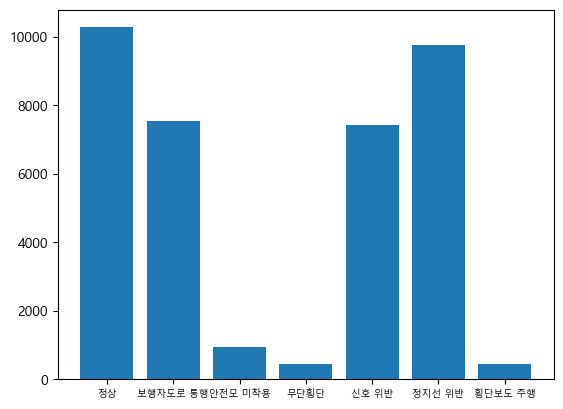

In [11]:
index = np.array(['정상', 
                  '보행자도로 통행', 
                  '안전모 미착용',
                  '무단횡단',
                  '신호 위반',
                  '정지선 위반',
                  '횡단보도 주행'])

# 한글 폰트 깨짐 방지 
plt.rcParams['font.family'] = 'Malgun Gothic'

plt.bar(index, df2.groupby(['PM_code'])['PM_code'].count())
plt.xticks(fontsize=7)

In [36]:
df2.groupby(['PM_code', 'time'])['PM_code'].count()

PM_code  time
13       D       8425
         N       1861
14       D       6992
         N        552
15       D        754
         N        190
16       D        409
         N         34
17       D       5612
         N       1823
18       D       8164
         N       1597
19       D        346
         N         97
Name: PM_code, dtype: int64

In [134]:
df2['PM_code'] = df2['PM_code'].replace({13: '정상',
                                        14: '보행자도로 통행',
                                        15: '안전모 미착용',
                                        16: '무단횡단',
                                        17: '신호 위반',
                                        18: '정지선 위반',
                                        19: '횡단보도 주행'})


In [135]:
df2

,video_id,is_scripted,weather,time,PM_code
0,C000002,0,F,D,신호 위반
1,C000002,0,F,D,정상
2,C000002,0,F,D,정상
3,C000002,0,F,D,정상
4,C000002,0,F,D,신호 위반
...,...,...,...,...,...
36851,T015483,1,R,D,정지선 위반
36852,T015483,1,R,D,정상
36853,T015489,1,R,D,정상
36854,T015490,1,R,D,정상


In [145]:
order = ['정상', 
          '보행자도로 통행', 
          '안전모 미착용',
          '무단횡단',
          '신호 위반',
          '정지선 위반',
          '횡단보도 주행']

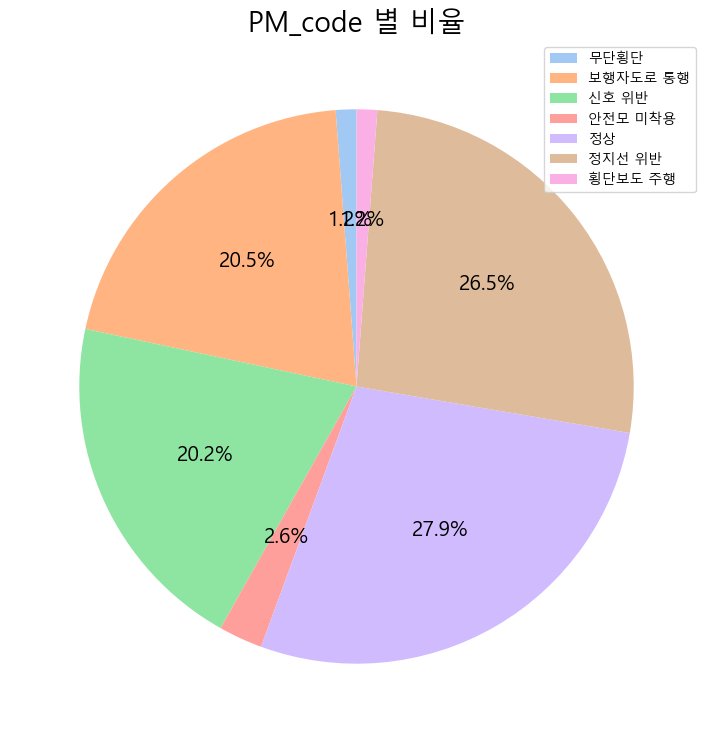

In [165]:
colors = sns.color_palette('pastel')[0:7]

plt.figure(figsize=(9, 9))

plt.pie(df2.groupby(['PM_code'])['PM_code'].count(),
        colors = colors,
        autopct='%.1f%%',
        startangle=90,
        textprops={'fontsize': 15})

plt.title('PM_code 별 비율', fontsize=20)
plt.legend(labels = df2.groupby(['PM_code'])['PM_code'].count().index, 
           loc='upper right')
plt.show()

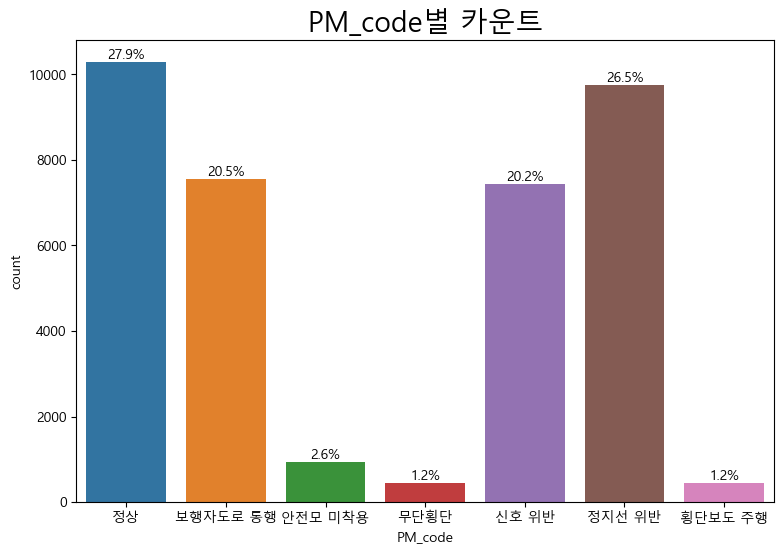

In [144]:
plt.figure(figsize=(9, 6))
ax = sns.countplot(x='PM_code', 
                   data=df2,
                   order=order)

for p in ax.patches:
    height = p.get_height()
    ax.text(x = p.get_x() + p.get_width()/2,
            y = p.get_height() + len(df2)*0.002,
            s = f'{p.get_height() / len(df2)*100:1.1f}%',
            ha = 'center')
    
plt.title('PM_code별 카운트', fontsize=20)
plt.show()

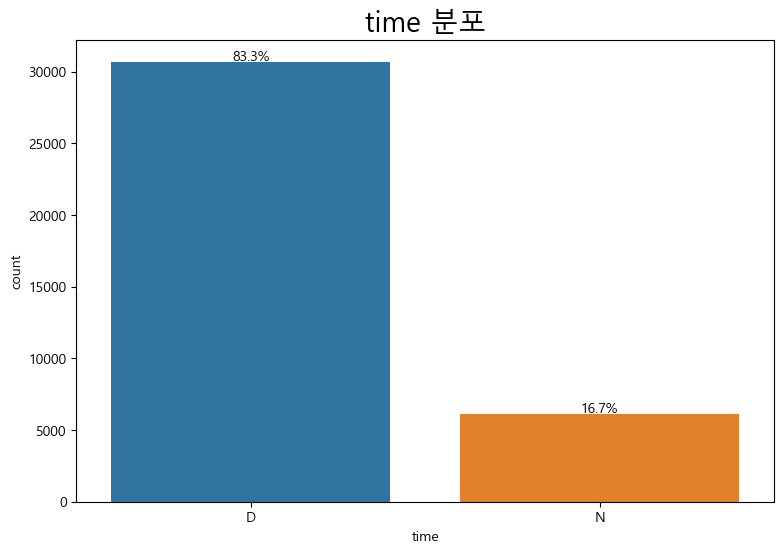

In [166]:
plt.figure(figsize=(9, 6))
ax = sns.countplot(x='time',
                   data=df2,)
 
for p in ax.patches:
    height = p.get_height()
    ax.text(x = p.get_x() + p.get_width()/2,
            y = p.get_height() + len(df2)*0.002,
            s = f'{p.get_height() / len(df2)*100:1.1f}%',
            ha = 'center')
    
plt.title('time 분포', fontsize=20)
plt.show()

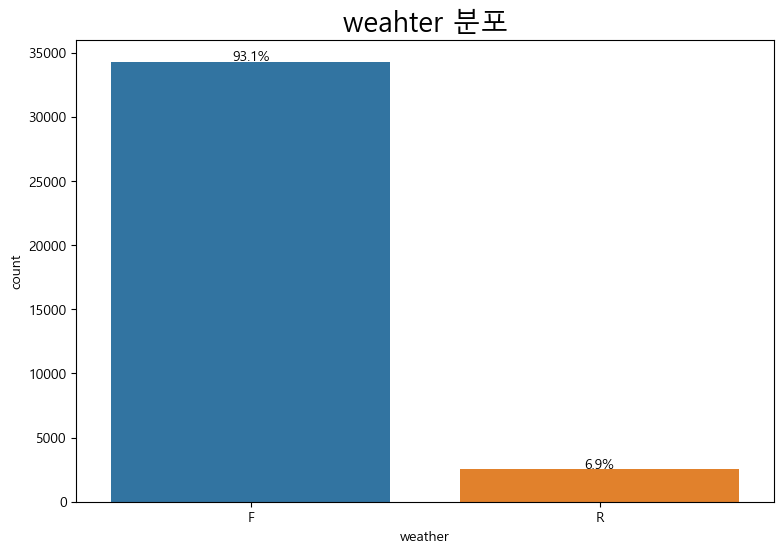

In [167]:
plt.figure(figsize=(9, 6))
ax = sns.countplot(x='weather',
                   data=df2,)
 
for p in ax.patches:
    height = p.get_height()
    ax.text(x = p.get_x() + p.get_width()/2,
            y = p.get_height() + len(df2)*0.002,
            s = f'{p.get_height() / len(df2)*100:1.1f}%',
            ha = 'center')
    
plt.title('weahter 분포', fontsize=20)
plt.show()

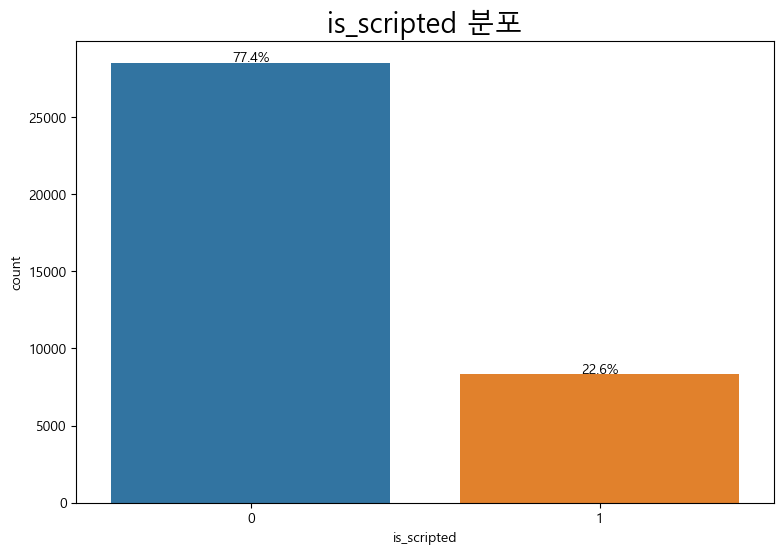

In [168]:
plt.figure(figsize=(9, 6))
ax = sns.countplot(x='is_scripted',
                   data=df2,)
 
for p in ax.patches:
    height = p.get_height()
    ax.text(x = p.get_x() + p.get_width()/2,
            y = p.get_height() + len(df2)*0.002,
            s = f'{p.get_height() / len(df2)*100:1.1f}%',
            ha = 'center')
    
plt.title('is_scripted 분포', fontsize=20)
plt.show()

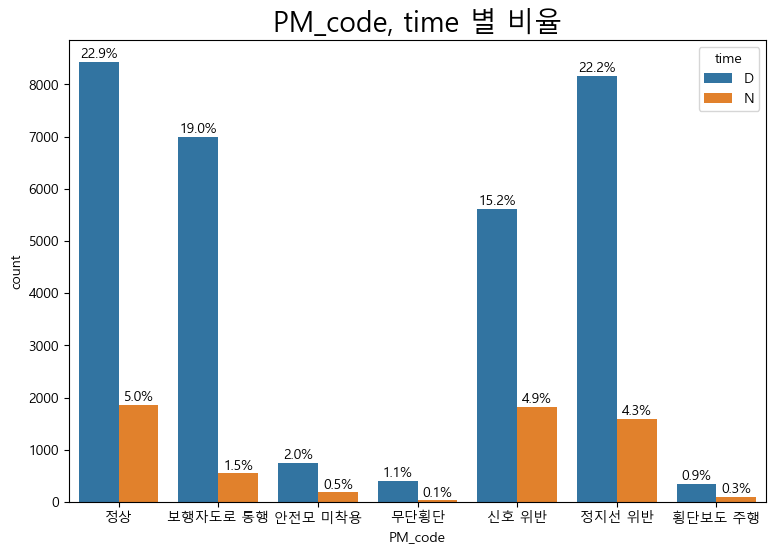

In [141]:
plt.figure(figsize=(9, 6))
ax = sns.countplot(x='PM_code', 
                   hue='time', 
                   data=df2,
                   order=order)
 
for p in ax.patches:
    height = p.get_height()
    ax.text(x = p.get_x() + p.get_width()/2,
            y = p.get_height() + len(df2)*0.002,
            s = f'{p.get_height() / len(df2)*100:1.1f}%',
            ha = 'center')
    
plt.title('PM_code, time 별 비율', fontsize=20)
plt.show()

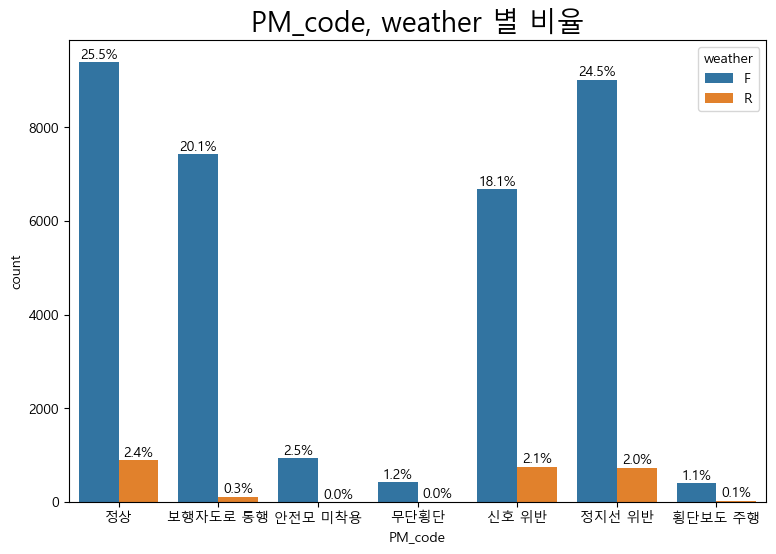

In [142]:
plt.figure(figsize=(9, 6))
ax = sns.countplot(x='PM_code', 
                   hue='weather', 
                   data=df2,
                   order=order)

for p in ax.patches:
    height = p.get_height()
    ax.text(x = p.get_x() + p.get_width()/2,
            y = p.get_height() + len(df2)*0.002,
            s = f'{p.get_height() / len(df2)*100:1.1f}%',
            ha = 'center')
    
plt.title('PM_code, weather 별 비율', fontsize=20)
plt.show()

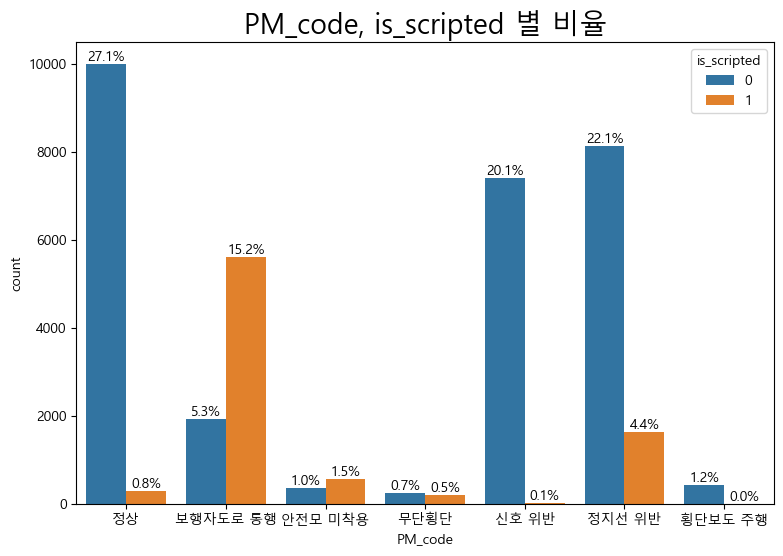

In [143]:
plt.figure(figsize=(9, 6))
ax = sns.countplot(x='PM_code', 
                   hue='is_scripted',
                   data=df2,
                   order=order)

for p in ax.patches:
    height = p.get_height()
    ax.text(x = p.get_x() + p.get_width()/2,
            y = p.get_height() + len(df2)*0.002,
            s = f'{p.get_height() / len(df2)*100:1.1f}%',
            ha = 'center')
    
plt.title('PM_code, is_scripted 별 비율', fontsize=20)
plt.show()

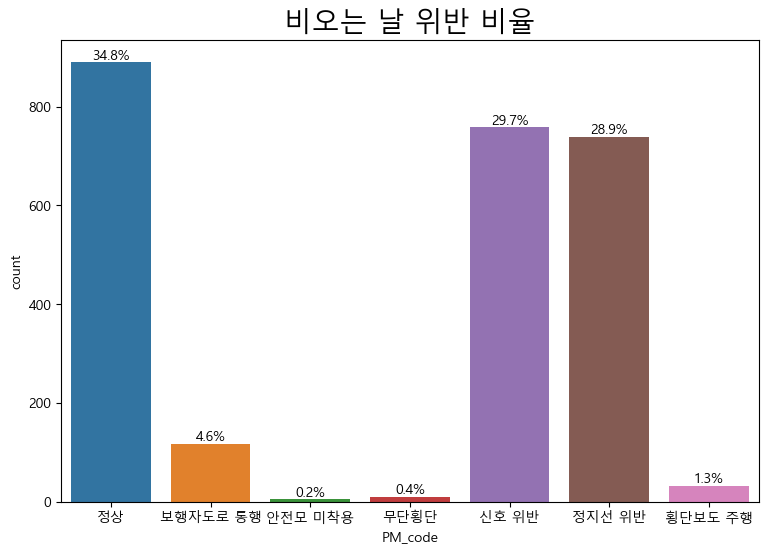

In [180]:
# 비오는 날에는 어떤 위반이 많은 지 

df_rain = df2[df2['weather'] == 'R']

plt.figure(figsize=(9, 6))
ax = sns.countplot(x='PM_code',
                   data=df_rain,
                   order=order)

for p in ax.patches:
    height = p.get_height()
    ax.text(x = p.get_x() + p.get_width()/2,
            y = p.get_height() + len(df_rain)*0.002,
            s = f'{p.get_height() / len(df_rain)*100:1.1f}%',
            ha = 'center')
    
plt.title('비오는 날 위반 비율', fontsize=20)
plt.show()

posx and posy should be finite values
posx and posy should be finite values


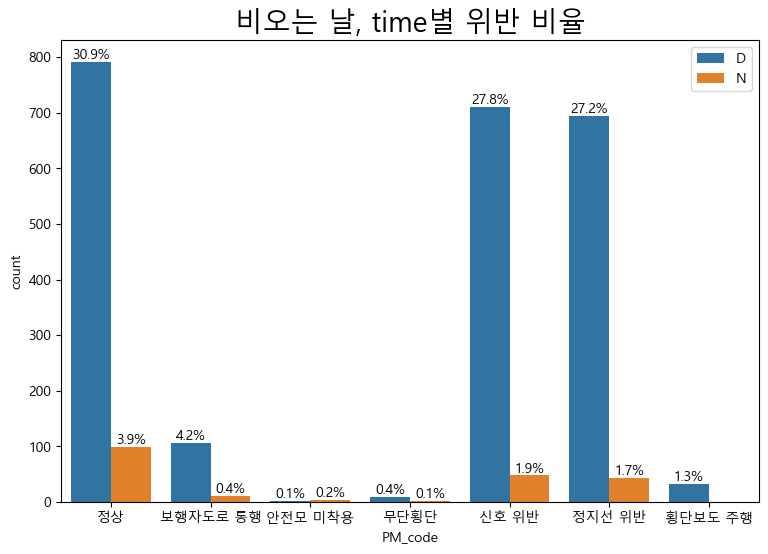

In [181]:
plt.figure(figsize=(9, 6))
ax = sns.countplot(x='PM_code',
                   hue='time',
                   data=df_rain,
                   order=order)

for p in ax.patches:
    height = p.get_height()
    ax.text(x = p.get_x() + p.get_width()/2,
            y = p.get_height() + len(df_rain)*0.002,
            s = f'{p.get_height() / len(df_rain)*100:1.1f}%',
            ha = 'center')
    
plt.title('비오는 날, time별 위반 비율', fontsize=20)
plt.legend(loc='upper right')
plt.show()

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


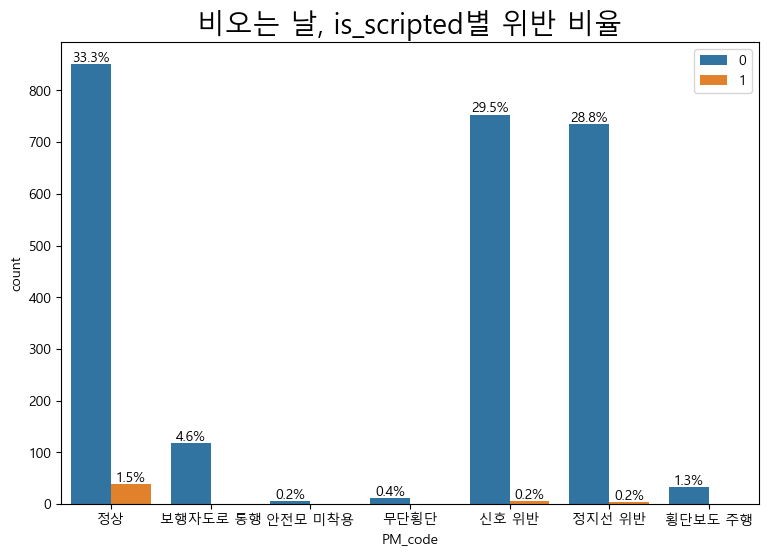

In [182]:
plt.figure(figsize=(9, 6))
ax = sns.countplot(x='PM_code',
                   hue='is_scripted',
                   data=df_rain,
                   order=order)

for p in ax.patches:
    height = p.get_height()
    ax.text(x = p.get_x() + p.get_width()/2,
            y = p.get_height() + len(df_rain)*0.002,
            s = f'{p.get_height() / len(df_rain)*100:1.1f}%',
            ha = 'center')
    
plt.title('비오는 날, is_scripted별 위반 비율', fontsize=20)
plt.legend(loc='upper right')
plt.show()

In [179]:
df_night = df2[df2['time'] == 'N']

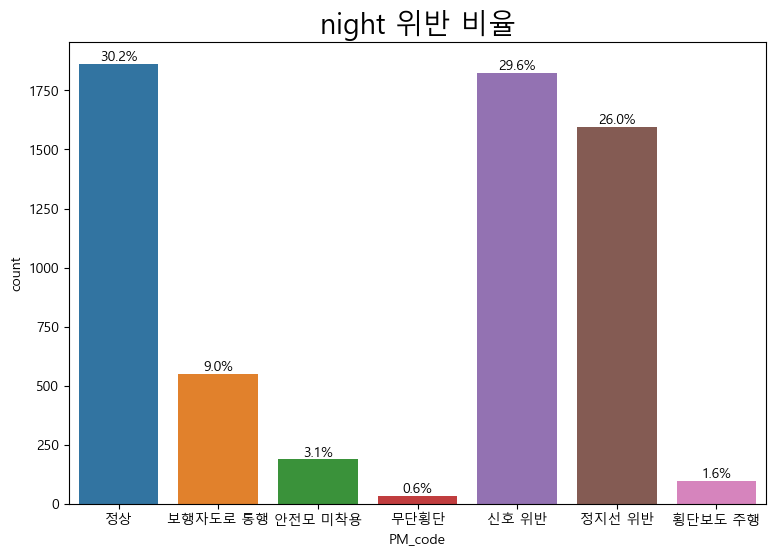

In [187]:
plt.figure(figsize=(9, 6))
ax = sns.countplot(x='PM_code',
                   data=df_night,
                   order=order)

for p in ax.patches:
    height = p.get_height()
    ax.text(x = p.get_x() + p.get_width()/2,
            y = p.get_height() + len(df_night)*0.002,
            s = f'{p.get_height() / len(df_night)*100:1.1f}%',
            ha = 'center')
    
plt.title('night 위반 비율', fontsize=20)
plt.show()

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


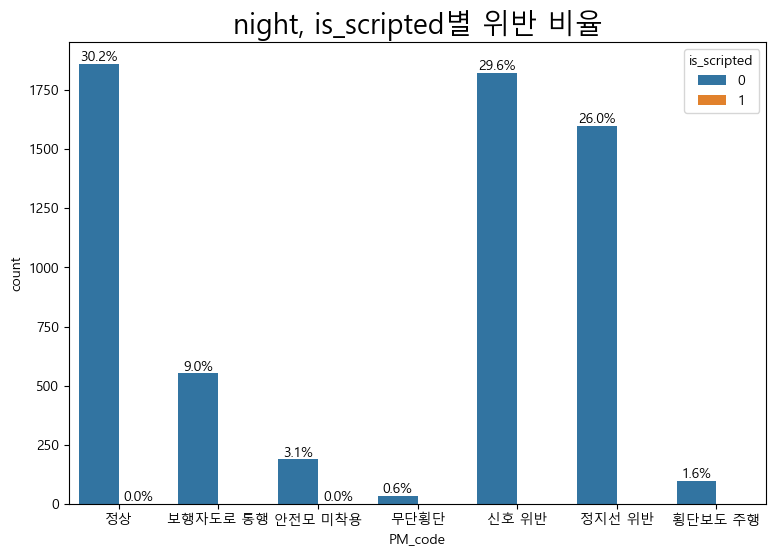

In [186]:
plt.figure(figsize=(9, 6))
ax = sns.countplot(x='PM_code',
                   data=df_night,
                   hue='is_scripted',
                   order=order)

for p in ax.patches:
    height = p.get_height()
    ax.text(x = p.get_x() + p.get_width()/2,
            y = p.get_height() + len(df_night)*0.002,
            s = f'{p.get_height() / len(df_night)*100:1.1f}%',
            ha = 'center')
    
plt.title('night, is_scripted별 위반 비율', fontsize=20)
plt.show()